In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
df = pd.read_csv('train.csv')

In [4]:
df.sample(7)

,client_id,app_date,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,foreign_passport,default
20278,40848,17FEB2014,SCH,F,36,Y,Y,0,0,-1.806992,0,80,2,3,150000,4,1,N,0
46532,53093,01MAR2014,SCH,M,26,Y,Y,0,0,-2.170639,4,50,1,1,50000,2,3,N,0
10657,17500,24JAN2014,SCH,M,28,Y,N,0,0,-1.776096,3,80,2,3,55000,1,3,N,0
13435,61155,10MAR2014,GRD,F,41,N,N,0,0,-1.593881,4,60,2,3,27000,4,3,N,0
29649,44809,21FEB2014,UGR,F,49,N,N,1,0,-0.699978,0,40,2,3,22000,2,3,N,1
20991,44999,21FEB2014,SCH,M,48,Y,Y,0,0,-2.219626,1,70,1,1,15000,1,2,N,0
380,74896,22MAR2014,GRD,M,29,N,N,7,0,-1.705911,4,50,2,3,25000,1,3,N,1


### Импорт данных
Описания полей

- client_id - идентификатор клиента
- education - уровень образования
- sex - пол заемщика
- age - возраст заемщика
- car - флаг наличия автомобиля
- car_type - флаг автомобиля иномарки
- decline_app_cnt - количество отказанных прошлых заявок
- good_work - флаг наличия “хорошей” работы
- bki_request_cnt - количество запросов в БКИ
- home_address - категоризатор домашнего адреса
- work_address - категоризатор рабочего адреса
- income - доход заемщика
- foreign_passport - наличие загранпаспорта
- sna - связь заемщика с клиентами банка
- first_time - давность наличия информации о заемщике
- score_bki - скоринговый балл по данным из БКИ
- region_rating - рейтинг региона
- app_date - дата подачи заявки
- default - флаг дефолта по кредиту (0-хороший заемщик, 1-плохой заемщик)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73799 entries, 0 to 73798
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   client_id         73799 non-null  int64  
 1   app_date          73799 non-null  object 
 2   education         73492 non-null  object 
 3   sex               73799 non-null  object 
 4   age               73799 non-null  int64  
 5   car               73799 non-null  object 
 6   car_type          73799 non-null  object 
 7   decline_app_cnt   73799 non-null  int64  
 8   good_work         73799 non-null  int64  
 9   score_bki         73799 non-null  float64
 10  bki_request_cnt   73799 non-null  int64  
 11  region_rating     73799 non-null  int64  
 12  home_address      73799 non-null  int64  
 13  work_address      73799 non-null  int64  
 14  income            73799 non-null  int64  
 15  sna               73799 non-null  int64  
 16  first_time        73799 non-null  int64 

### Из верхней клетки с кодом мы можем увидеть, что в колонне education есть нулевые значения

In [6]:
print(f'{round(df.education.isna().sum()/df.education.notna().sum()*100, 3)}% пропущенных значений')

0.418% пропущенных значений


In [7]:
df.education.unique()

array(['SCH', 'GRD', 'UGR', 'PGR', 'ACD', nan], dtype=object)

In [8]:
edmode = df.education.mode()[0] #мы проп. значения заполним наиболее частым значений в колонне, то есть mode

In [9]:
df.education = df.education.fillna(edmode)

In [10]:
df.describe(include=object)

,app_date,education,sex,car,car_type,foreign_passport
count,73799,73799,73799,73799,73799,73799
unique,120,5,2,2,2,2
top,18MAR2014,SCH,F,N,N,N
freq,1018,39167,41562,49832,59791,62733


### Сконвертируем тип данных home_address и work_address из числа в объект

In [11]:
df[['home_address', 'work_address']] = df[['home_address', 'work_address']].astype(object)

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73799 entries, 0 to 73798
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   client_id         73799 non-null  int64  
 1   app_date          73799 non-null  object 
 2   education         73799 non-null  object 
 3   sex               73799 non-null  object 
 4   age               73799 non-null  int64  
 5   car               73799 non-null  object 
 6   car_type          73799 non-null  object 
 7   decline_app_cnt   73799 non-null  int64  
 8   good_work         73799 non-null  int64  
 9   score_bki         73799 non-null  float64
 10  bki_request_cnt   73799 non-null  int64  
 11  region_rating     73799 non-null  int64  
 12  home_address      73799 non-null  object 
 13  work_address      73799 non-null  object 
 14  income            73799 non-null  int64  
 15  sna               73799 non-null  int64  
 16  first_time        73799 non-null  int64 

In [13]:
df.describe(include=object)

,app_date,education,sex,car,car_type,home_address,work_address,foreign_passport
count,73799,73799,73799,73799,73799,73799,73799,73799
unique,120,5,2,2,2,3,3,2
top,18MAR2014,SCH,F,N,N,2,3,N
freq,1018,39167,41562,49832,59791,39956,44959,62733


### Exploratory Data Analysis

Гипотезы:

- Возраст "хороших" заемщиков больше, по сравнению с "плохими" (распределения возраста в зависимости от флага дефолта смещено в большую сторону при default=0)
- Уровень образования зависит от возраста, что влияет и на возврат кредита, также люди с высшим образованием чаще являются "хорошими" заемщиками
- При good_work = 0 увеличивается риск невозврата кредита (флаг дефолта)
- Доход "хороших" заемщиков больше, по сравнению с "плохими" (распределения дохода в зависимости от флага дефолта смещено в большую сторону при default=0)
- score_bki напрямую взаимосвязан с default, чем он меньше, тем выше вероятность клиента выплатить кредит банку (джаст предположение)

### Изучаем теперь целевую переменную

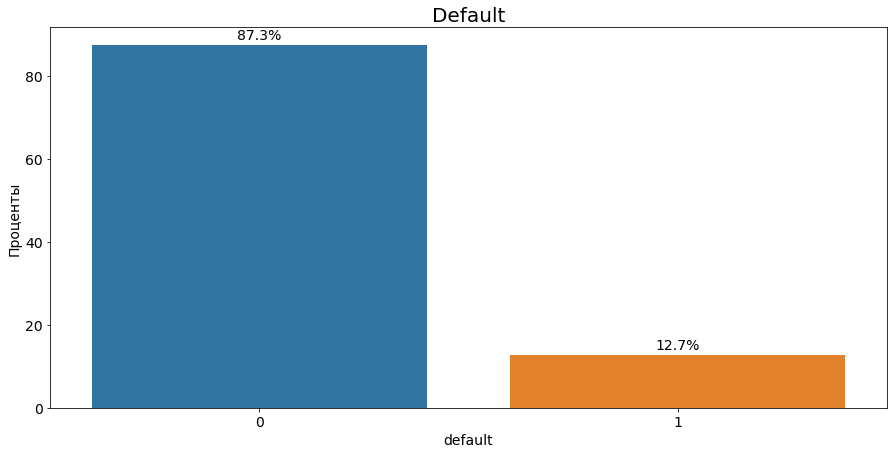

In [14]:
# нормирование на размер датасета
norm_target = (df
               .default
               .value_counts(normalize=True)
               .mul(100)
               .rename('percent')
               .reset_index())

plt.figure(figsize=(15, 7))
ax = sns.barplot(x='index', y='percent', data=norm_target)

# Вывод значений над графиками - annotate()
# В цикле смотрим каждый столбец графика и на нем отмечаем значения
for p in ax.patches:
    percentage = '{:.1f}%'.format(p.get_height())
    ax.annotate(percentage,  # текст
                (p.get_x() + p.get_width() / 2., p.get_height()),  # координата xy
                ha='center', # центрирование
                va='center',
                xytext=(0, 10),
                textcoords='offset points', # точка смещения относительно координаты
                fontsize=14)

plt.title('Default', fontsize=20)

plt.xlabel('default', fontsize=14)
plt.ylabel('Проценты', fontsize=14)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14);

#### Какой же дисбаланс в таргет!

### Давайте теперь по поставленным гипотезам двигаться дальше: переходим к анализу age

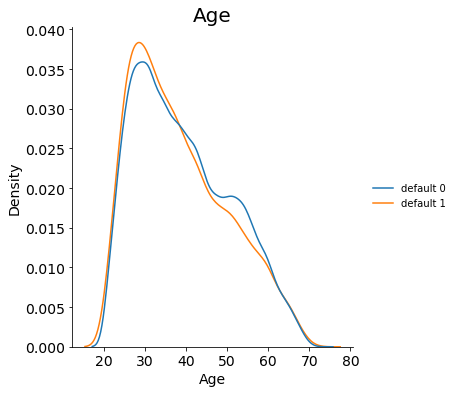

In [15]:
sns.displot(
    {
        "default 0": df[df.default == 0].age,
        "default 1": df[df.default == 1].age
    },
     kind="kde",
     common_norm=False # независимая нормализация каждого подмножества
)

plt.title('Age', fontsize=20)
plt.xlabel('Age', fontsize=14)
plt.ylabel('Density', fontsize=14)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14);

In [16]:
df.groupby('default')['age'].median()

default
0    38.0
1    36.0
Name: age, dtype: float64

In [17]:
df.groupby('default')['age'].apply(lambda x: x.value_counts().index[0]).reset_index()

,default,age
0,0,31
1,1,26


#### гипотеза касательно возраста подтвердилась

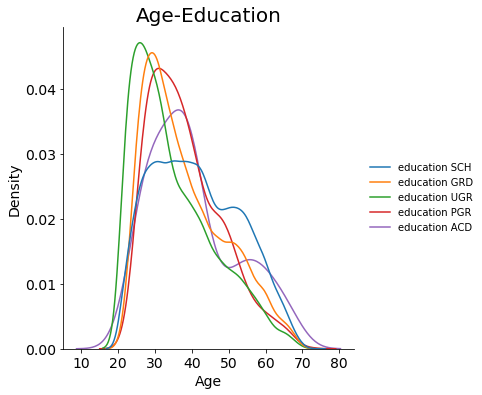

In [18]:
sns.displot(
    {
        "education SCH": df[df.education == 'SCH'].age,
        "education GRD": df[df.education == 'GRD'].age,
        "education UGR": df[df.education == 'UGR'].age,
        "education PGR": df[df.education == 'PGR'].age,
        "education ACD": df[df.education == 'ACD'].age,
    },
    kind="kde",
    common_norm=False
)

plt.title('Age-Education', fontsize=20)
plt.xlabel('Age', fontsize=14)
plt.ylabel('Density', fontsize=14)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14);

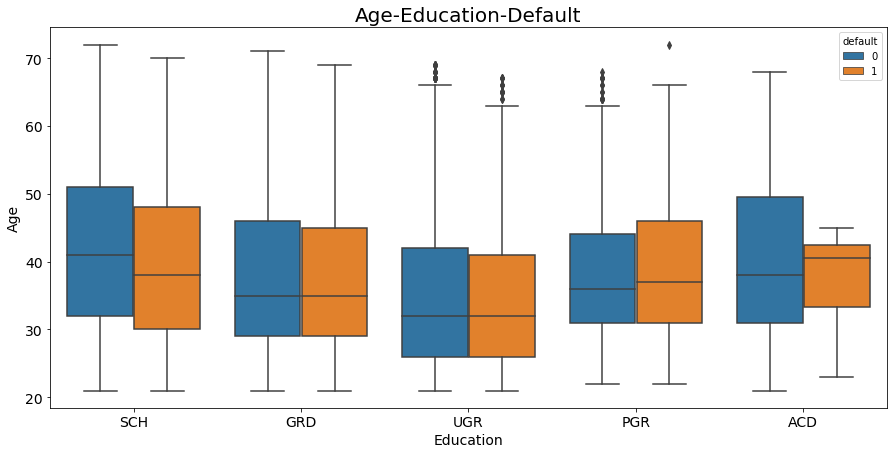

In [19]:
plt.figure(figsize=(15, 7))

sns.boxplot(x='education', y='age', hue='default', data=df)

plt.title('Age-Education-Default', fontsize=20)
plt.ylabel('Age', fontsize=14)
plt.xlabel('Education', fontsize=14)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14);

In [20]:
df.groupby('education')['age'].median()

education
ACD    38.0
GRD    35.0
PGR    36.0
SCH    40.0
UGR    32.0
Name: age, dtype: float64

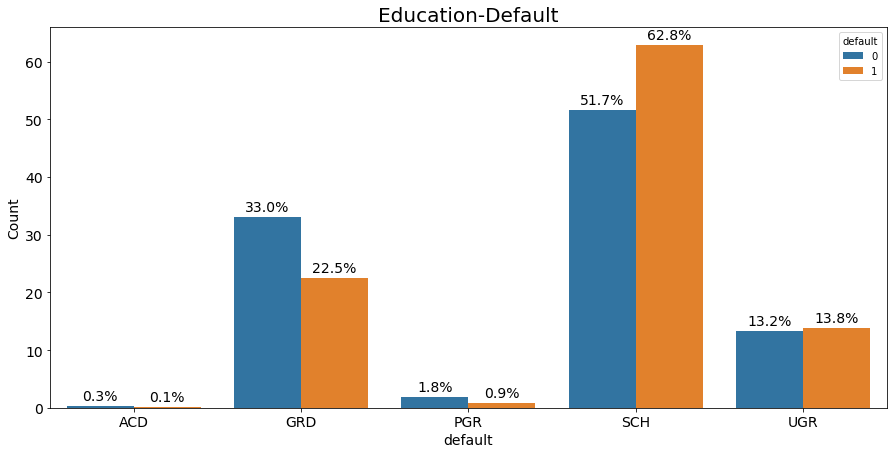

In [21]:
plt.figure(figsize=(15, 7))

educ_def = (df.groupby(['default'])['education']
            .value_counts(normalize=True)
            .rename('percentage')
            .mul(100)
            .reset_index()
            .sort_values('education'))

ax = sns.barplot(x="education", y="percentage", hue="default", data=educ_def)

for p in ax.patches:
    percentage = '{:.1f}%'.format(p.get_height())
    ax.annotate(percentage,  # текст
                (p.get_x() + p.get_width() / 2., p.get_height()),  # координата xy
                ha='center',  # центрирование
                va='center',
                xytext=(0, 10),
                textcoords='offset points',  # точка смещения относительно координаты
                fontsize=14)

plt.title('Education-Default', fontsize=20)
plt.ylabel('Count', fontsize=14)
plt.xlabel('default', fontsize=14)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14);

In [22]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
num_cols = df.select_dtypes(include=numerics)

In [23]:
num_cols = num_cols.drop(df[['client_id', 'default']], axis=1)

### Correlation matrix

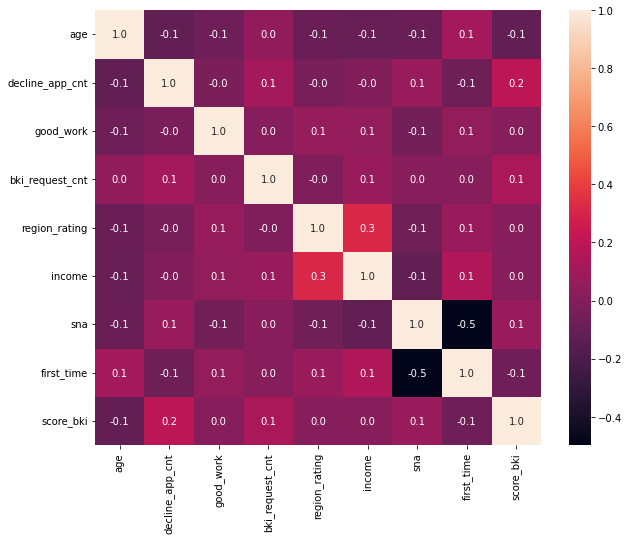

In [24]:
num_cols = ['age', 'decline_app_cnt', 'good_work', 'bki_request_cnt',
       'region_rating', 'income', 'sna', 'first_time', 'score_bki']

plt.figure(figsize=(10, 8))

sns.heatmap(df[num_cols].corr(method='spearman'), annot=True, fmt=".1f");

### Income analysis

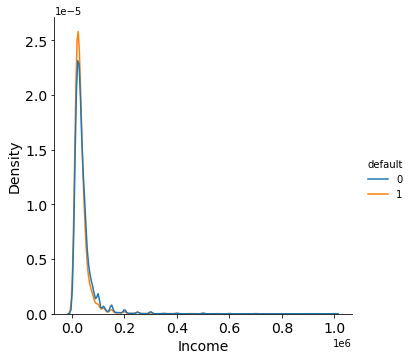

In [25]:
sns.displot(df, x='income', hue='default', kind='kde', common_norm=False)

plt.xlabel('Income', fontsize=14)
plt.ylabel('Density', fontsize=14)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14);

In [26]:
df.groupby('default')['income'].mean()

default
0    41799.713288
1    36288.113316
Name: income, dtype: float64

In [27]:
df.groupby('default')['income'].median()

default
0    30000.0
1    28000.0
Name: income, dtype: float64

In [28]:
import plotly.express as px
for col in num_cols:
    fig = px.histogram(df, x=col)
    fig.show()

In [29]:
df_income = df.copy()
df_income.income = np.log(df.income)

In [30]:
px.histogram(df, x=df_income.income+1)

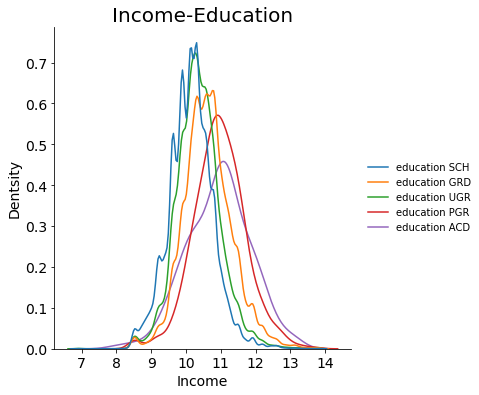

In [31]:
sns.displot(
    {
        "education SCH": df_income[df_income.education == 'SCH'].income,
        "education GRD": df_income[df_income.education == 'GRD'].income,
        "education UGR": df_income[df_income.education == 'UGR'].income,
        "education PGR": df_income[df_income.education == 'PGR'].income,
        "education ACD": df_income[df_income.education == 'ACD'].income,
    },
    kind="kde",
    common_norm=False
)

plt.title('Income-Education', fontsize=20)
plt.xlabel('Income', fontsize=14)
plt.ylabel('Dentsity', fontsize=14)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14);

### Feature Engineering

In [32]:
num_cols = ['age', 'decline_app_cnt', 'score_bki',
            'bki_request_cnt', 'income', 'first_time','region_rating']

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\ProgramData\Anaconda3\lib\site-pac

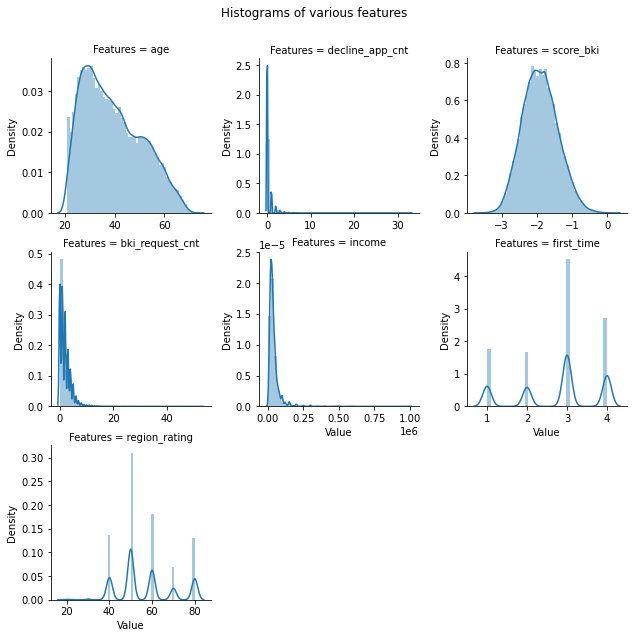

In [33]:
numeric_features = df[num_cols]

numeric_features = numeric_features.stack().reset_index().rename(
    columns={"level_1": "Features", 0: "Value"})

ax = sns.FacetGrid(data=numeric_features, col="Features",
                  col_wrap=3, sharex=False, sharey=False)
ax = ax.map(sns.distplot, "Value")

plt.subplots_adjust(top=0.9)
plt.suptitle("Histograms of various features");

In [34]:
# Новый признак - месяц
df['app_date'] = pd.to_datetime(df['app_date'], format='%d%b%Y')
df['month'] = df['app_date'].dt.month.astype(object)

df.drop(['app_date'],  axis=1, inplace=True)

In [35]:
df.columns

Index(['client_id', 'education', 'sex', 'age', 'car', 'car_type',
       'decline_app_cnt', 'good_work', 'score_bki', 'bki_request_cnt',
       'region_rating', 'home_address', 'work_address', 'income', 'sna',
       'first_time', 'foreign_passport', 'default', 'month'],
      dtype='object')

In [36]:
# Средний доход с учетом рейтинга региона

mean_inc_reg = df.groupby('region_rating')['income'].median().to_dict()
df['mean_income_region'] = df['region_rating'].map(mean_inc_reg)

In [37]:
# Средний доход с учетом возраста

mean_inc_age = df.groupby('age')['income'].median().to_dict()
df['mean_income_age'] = df['age'].map(mean_inc_age)

In [38]:
# Средний score bki с учетом возраста

mean_bki_age = df.groupby('age')['score_bki'].median().to_dict()
df['mean_bki_age'] = df['age'].map(mean_bki_age)

In [39]:
df.head(5)

,client_id,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,...,work_address,income,sna,first_time,foreign_passport,default,month,mean_income_region,mean_income_age,mean_bki_age
0,25905,SCH,M,62,Y,Y,0,0,-2.008753,1,...,2,18000,4,1,N,0,2,25000.0,20000.0,-1.981476
1,63161,SCH,F,59,N,N,0,0,-1.532276,3,...,3,19000,4,1,N,0,3,25000.0,22000.0,-1.994864
2,25887,SCH,M,25,Y,N,2,0,-1.408142,1,...,2,30000,1,4,Y,0,2,47000.0,30000.0,-1.814637
3,16222,SCH,F,53,N,N,0,0,-2.057471,2,...,3,10000,1,3,N,0,1,25000.0,27250.0,-1.993905
4,101655,GRD,M,48,N,N,0,1,-1.244723,1,...,3,30000,1,4,Y,0,4,30000.0,30000.0,-1.988764


In [40]:
cat_cols = ['education', 'sex', 'car', 'car_type', 'good_work', 'home_address', 'work_address',
       'foreign_passport', 'sna', 'month']

In [41]:
num_cols = list(df.dtypes[df.dtypes == float].index) + list(df.dtypes[df.dtypes == int].index)[1:-1]

In [42]:
num_cols = list(df.describe().columns)[1:]

In [43]:
num_cols.remove('default')

In [44]:
num_cols

['age',
 'decline_app_cnt',
 'good_work',
 'score_bki',
 'bki_request_cnt',
 'region_rating',
 'income',
 'sna',
 'first_time',
 'mean_income_region',
 'mean_income_age',
 'mean_bki_age']

In [45]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73799 entries, 0 to 73798
Data columns (total 22 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   client_id           73799 non-null  int64  
 1   education           73799 non-null  object 
 2   sex                 73799 non-null  object 
 3   age                 73799 non-null  int64  
 4   car                 73799 non-null  object 
 5   car_type            73799 non-null  object 
 6   decline_app_cnt     73799 non-null  int64  
 7   good_work           73799 non-null  int64  
 8   score_bki           73799 non-null  float64
 9   bki_request_cnt     73799 non-null  int64  
 10  region_rating       73799 non-null  int64  
 11  home_address        73799 non-null  object 
 12  work_address        73799 non-null  object 
 13  income              73799 non-null  int64  
 14  sna                 73799 non-null  int64  
 15  first_time          73799 non-null  int64  
 16  fore

###  Моделирование

#### Перевод категориальных значений в числовые

In [46]:
df.shape

(73799, 22)

In [47]:
df[list(set(df.columns) - set(num_cols))].nunique()

foreign_passport        2
education               5
month                   4
client_id           73799
work_address            3
sex                     2
default                 2
home_address            3
car                     2
car_type                2
dtype: int64

In [48]:
# в принципе можем воспользоваться dummies для конвертирования в числовые значения

df_label = pd.get_dummies(df, columns=cat_cols,
                          drop_first=True).drop('client_id', axis=1)

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\algorithms.py:798: FutureWarning:

In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)



In [49]:
df_label.sample(6)

,age,decline_app_cnt,score_bki,bki_request_cnt,region_rating,income,first_time,default,mean_income_region,mean_income_age,...,home_address_3,work_address_2,work_address_3,foreign_passport_Y,sna_2,sna_3,sna_4,month_2,month_3,month_4
34175,38,0,-1.065174,1,50,35000,4,1,25000.0,35000.0,...,0,0,1,1,0,0,0,0,0,1
7684,23,0,-1.632487,0,50,15000,3,1,25000.0,30000.0,...,0,1,0,0,0,0,0,0,0,0
71878,47,0,-2.481010,2,40,10000,3,0,25000.0,30000.0,...,0,1,0,0,0,0,0,0,0,1
45753,60,0,-1.752965,6,60,30000,1,0,30000.0,20000.0,...,0,1,0,0,0,0,0,0,0,1
48924,32,0,-1.599430,3,50,40000,2,0,25000.0,32000.0,...,0,1,0,0,1,0,0,0,0,0
7378,23,1,-2.214536,0,60,25000,3,0,30000.0,30000.0,...,0,0,1,0,0,0,1,1,0,0


#### Train-test сплит

In [93]:
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import precision_score, recall_score, auc, accuracy_score, roc_auc_score,f1_score,log_loss,\
classification_report, roc_curve

In [71]:
X = df_label.drop('default', axis=1)
y = df_label['default']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, shuffle=True, random_state=20)

### Baseline

In [72]:
lr = LogisticRegression(class_weight='balanced')
lr.fit(X_train, y_train)

LogisticRegression(class_weight='balanced')

In [73]:
y_pred = lr.predict(X_test)
y_score = lr.predict_proba(X_test)[:, 1]

In [74]:
y_pred

array([1, 1, 1, ..., 1, 0, 1], dtype=int64)

In [75]:
y_score.shape

(14760,)

In [76]:
y_score

array([0.5458787 , 0.52345619, 0.56457404, ..., 0.53232358, 0.30912525,
       0.55873428])

In [77]:
print('roc-auc:', roc_auc_score(y_test, y_score))
print('precision:', precision_score(y_test, y_pred))
print('recall:', recall_score(y_test, y_pred))
print('f1:', f1_score(y_test, y_pred))
print('logloss:', log_loss(y_test, y_pred))

roc-auc: 0.571291247721792
precision: 0.1481736733287388
recall: 0.688367129135539
f1: 0.2438563327032136
logloss: 18.720605757034402


#### Если банку выгоднее пресказать лучше больше "плохих" клиентов, чтобы избежать большие потери, то лучше ориентироваться еще на метрику recall, если будем сравнивать в baseline и другими алгоритмами, иначе precision.

In [78]:
metrics = pd.DataFrame(
                index=['roc-auc', 'precision', 'recall', 'f1-score', 'logloss'])
metrics['Baseline_LR'] = [roc_auc_score(y_test, y_score),
                          precision_score(y_test, y_pred),
                          recall_score(y_test, y_pred),
                          f1_score(y_test, y_pred),
                          log_loss(y_test, y_pred)]

In [79]:
metrics

,Baseline_LR
roc-auc,0.571291
precision,0.148174
recall,0.688367
f1-score,0.243856
logloss,18.720606


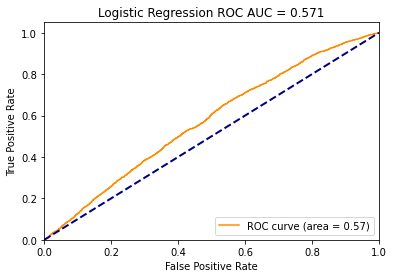

In [91]:

fpr, tpr, thresholds = roc_curve(y_test, y_score)

roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, color='darkorange', label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

plt.title('Logistic Regression ROC AUC = %0.3f' % roc_auc)
plt.legend(loc="lower right")
plt.show()

### Подбор параметров 

In [97]:
import warnings
warnings.filterwarnings('ignore')

In [94]:
parameters_grid = {
    'penalty': ['l1', 'l2', 'elasticnet'],
    'C': np.linspace(1, 1000, num=5),
    'solver': ['sag', 'saga', 'lbfgs'],
    'l1_ratio': [0.25, 0.5, 0.75],
    'max_iter': np.arange(100, 500, 100)
}

lr = LogisticRegression(class_weight='balanced')
cv = StratifiedKFold(n_splits=3, shuffle=True)
grid_cv = GridSearchCV(lr, parameters_grid,
                       scoring='roc_auc', cv=cv, verbose=2)

In [98]:
%%time
# производим обучение по сетке
grid_cv.fit(X_train, y_train)

Fitting 3 folds for each of 540 candidates, totalling 1620 fits
[CV] END C=1.0, l1_ratio=0.25, max_iter=100, penalty=l1, solver=sag; total time=   0.0s
[CV] END C=1.0, l1_ratio=0.25, max_iter=100, penalty=l1, solver=sag; total time=   0.0s
[CV] END C=1.0, l1_ratio=0.25, max_iter=100, penalty=l1, solver=sag; total time=   0.0s
[CV] END C=1.0, l1_ratio=0.25, max_iter=100, penalty=l1, solver=saga; total time=   2.8s
[CV] END C=1.0, l1_ratio=0.25, max_iter=100, penalty=l1, solver=saga; total time=   2.4s
[CV] END C=1.0, l1_ratio=0.25, max_iter=100, penalty=l1, solver=saga; total time=   2.6s
[CV] END C=1.0, l1_ratio=0.25, max_iter=100, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END C=1.0, l1_ratio=0.25, max_iter=100, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END C=1.0, l1_ratio=0.25, max_iter=100, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END C=1.0, l1_ratio=0.25, max_iter=100, penalty=l2, solver=sag; total time=   2.2s
[CV] END C=1.0, l1_ratio=0.25, max_iter=100, pe

[CV] END C=1.0, l1_ratio=0.25, max_iter=400, penalty=l2, solver=sag; total time=   8.7s
[CV] END C=1.0, l1_ratio=0.25, max_iter=400, penalty=l2, solver=sag; total time=   8.5s
[CV] END C=1.0, l1_ratio=0.25, max_iter=400, penalty=l2, solver=sag; total time=   7.1s
[CV] END C=1.0, l1_ratio=0.25, max_iter=400, penalty=l2, solver=saga; total time=   8.1s
[CV] END C=1.0, l1_ratio=0.25, max_iter=400, penalty=l2, solver=saga; total time=   9.1s
[CV] END C=1.0, l1_ratio=0.25, max_iter=400, penalty=l2, solver=saga; total time=   8.7s
[CV] END C=1.0, l1_ratio=0.25, max_iter=400, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END C=1.0, l1_ratio=0.25, max_iter=400, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END C=1.0, l1_ratio=0.25, max_iter=400, penalty=l2, solver=lbfgs; total time=   0.1s
[CV] END C=1.0, l1_ratio=0.25, max_iter=400, penalty=elasticnet, solver=sag; total time=   0.0s
[CV] END C=1.0, l1_ratio=0.25, max_iter=400, penalty=elasticnet, solver=sag; total time=   0.0s
[CV] EN

[CV] END C=1.0, l1_ratio=0.5, max_iter=300, penalty=elasticnet, solver=saga; total time=   7.2s
[CV] END C=1.0, l1_ratio=0.5, max_iter=300, penalty=elasticnet, solver=saga; total time=   7.3s
[CV] END C=1.0, l1_ratio=0.5, max_iter=300, penalty=elasticnet, solver=saga; total time=   7.1s
[CV] END C=1.0, l1_ratio=0.5, max_iter=300, penalty=elasticnet, solver=lbfgs; total time=   0.0s
[CV] END C=1.0, l1_ratio=0.5, max_iter=300, penalty=elasticnet, solver=lbfgs; total time=   0.0s
[CV] END C=1.0, l1_ratio=0.5, max_iter=300, penalty=elasticnet, solver=lbfgs; total time=   0.0s
[CV] END C=1.0, l1_ratio=0.5, max_iter=400, penalty=l1, solver=sag; total time=   0.0s
[CV] END C=1.0, l1_ratio=0.5, max_iter=400, penalty=l1, solver=sag; total time=   0.0s
[CV] END C=1.0, l1_ratio=0.5, max_iter=400, penalty=l1, solver=sag; total time=   0.0s
[CV] END C=1.0, l1_ratio=0.5, max_iter=400, penalty=l1, solver=saga; total time=   8.6s
[CV] END C=1.0, l1_ratio=0.5, max_iter=400, penalty=l1, solver=saga; tot

[CV] END C=1.0, l1_ratio=0.75, max_iter=300, penalty=l1, solver=saga; total time=   7.5s
[CV] END C=1.0, l1_ratio=0.75, max_iter=300, penalty=l1, solver=saga; total time=   7.8s
[CV] END C=1.0, l1_ratio=0.75, max_iter=300, penalty=l1, solver=saga; total time=   7.5s
[CV] END C=1.0, l1_ratio=0.75, max_iter=300, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END C=1.0, l1_ratio=0.75, max_iter=300, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END C=1.0, l1_ratio=0.75, max_iter=300, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END C=1.0, l1_ratio=0.75, max_iter=300, penalty=l2, solver=sag; total time=   4.6s
[CV] END C=1.0, l1_ratio=0.75, max_iter=300, penalty=l2, solver=sag; total time=   6.1s
[CV] END C=1.0, l1_ratio=0.75, max_iter=300, penalty=l2, solver=sag; total time=   6.4s
[CV] END C=1.0, l1_ratio=0.75, max_iter=300, penalty=l2, solver=saga; total time=   6.4s
[CV] END C=1.0, l1_ratio=0.75, max_iter=300, penalty=l2, solver=saga; total time=   5.8s
[CV] END C=1.0, l1_ra

[CV] END C=250.75, l1_ratio=0.25, max_iter=200, penalty=l2, solver=sag; total time=   4.2s
[CV] END C=250.75, l1_ratio=0.25, max_iter=200, penalty=l2, solver=saga; total time=   3.7s
[CV] END C=250.75, l1_ratio=0.25, max_iter=200, penalty=l2, solver=saga; total time=   4.3s
[CV] END C=250.75, l1_ratio=0.25, max_iter=200, penalty=l2, solver=saga; total time=   4.3s
[CV] END C=250.75, l1_ratio=0.25, max_iter=200, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END C=250.75, l1_ratio=0.25, max_iter=200, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END C=250.75, l1_ratio=0.25, max_iter=200, penalty=l2, solver=lbfgs; total time=   0.1s
[CV] END C=250.75, l1_ratio=0.25, max_iter=200, penalty=elasticnet, solver=sag; total time=   0.0s
[CV] END C=250.75, l1_ratio=0.25, max_iter=200, penalty=elasticnet, solver=sag; total time=   0.0s
[CV] END C=250.75, l1_ratio=0.25, max_iter=200, penalty=elasticnet, solver=sag; total time=   0.0s
[CV] END C=250.75, l1_ratio=0.25, max_iter=200, penalty=e

[CV] END C=250.75, l1_ratio=0.5, max_iter=100, penalty=l2, solver=lbfgs; total time=   0.1s
[CV] END C=250.75, l1_ratio=0.5, max_iter=100, penalty=elasticnet, solver=sag; total time=   0.0s
[CV] END C=250.75, l1_ratio=0.5, max_iter=100, penalty=elasticnet, solver=sag; total time=   0.0s
[CV] END C=250.75, l1_ratio=0.5, max_iter=100, penalty=elasticnet, solver=sag; total time=   0.0s
[CV] END C=250.75, l1_ratio=0.5, max_iter=100, penalty=elasticnet, solver=saga; total time=   2.4s
[CV] END C=250.75, l1_ratio=0.5, max_iter=100, penalty=elasticnet, solver=saga; total time=   2.4s
[CV] END C=250.75, l1_ratio=0.5, max_iter=100, penalty=elasticnet, solver=saga; total time=   2.9s
[CV] END C=250.75, l1_ratio=0.5, max_iter=100, penalty=elasticnet, solver=lbfgs; total time=   0.0s
[CV] END C=250.75, l1_ratio=0.5, max_iter=100, penalty=elasticnet, solver=lbfgs; total time=   0.0s
[CV] END C=250.75, l1_ratio=0.5, max_iter=100, penalty=elasticnet, solver=lbfgs; total time=   0.0s
[CV] END C=250.75

[CV] END C=250.75, l1_ratio=0.75, max_iter=100, penalty=l1, solver=saga; total time=   2.2s
[CV] END C=250.75, l1_ratio=0.75, max_iter=100, penalty=l1, solver=saga; total time=   2.4s
[CV] END C=250.75, l1_ratio=0.75, max_iter=100, penalty=l1, solver=saga; total time=   2.3s
[CV] END C=250.75, l1_ratio=0.75, max_iter=100, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END C=250.75, l1_ratio=0.75, max_iter=100, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END C=250.75, l1_ratio=0.75, max_iter=100, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END C=250.75, l1_ratio=0.75, max_iter=100, penalty=l2, solver=sag; total time=   1.8s
[CV] END C=250.75, l1_ratio=0.75, max_iter=100, penalty=l2, solver=sag; total time=   2.1s
[CV] END C=250.75, l1_ratio=0.75, max_iter=100, penalty=l2, solver=sag; total time=   2.0s
[CV] END C=250.75, l1_ratio=0.75, max_iter=100, penalty=l2, solver=saga; total time=   1.6s
[CV] END C=250.75, l1_ratio=0.75, max_iter=100, penalty=l2, solver=saga; total t

[CV] END C=250.75, l1_ratio=0.75, max_iter=400, penalty=l2, solver=sag; total time=   8.4s
[CV] END C=250.75, l1_ratio=0.75, max_iter=400, penalty=l2, solver=sag; total time=   8.2s
[CV] END C=250.75, l1_ratio=0.75, max_iter=400, penalty=l2, solver=sag; total time=   9.2s
[CV] END C=250.75, l1_ratio=0.75, max_iter=400, penalty=l2, solver=saga; total time=   8.5s
[CV] END C=250.75, l1_ratio=0.75, max_iter=400, penalty=l2, solver=saga; total time=  10.1s
[CV] END C=250.75, l1_ratio=0.75, max_iter=400, penalty=l2, solver=saga; total time=   9.1s
[CV] END C=250.75, l1_ratio=0.75, max_iter=400, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END C=250.75, l1_ratio=0.75, max_iter=400, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END C=250.75, l1_ratio=0.75, max_iter=400, penalty=l2, solver=lbfgs; total time=   0.1s
[CV] END C=250.75, l1_ratio=0.75, max_iter=400, penalty=elasticnet, solver=sag; total time=   0.0s
[CV] END C=250.75, l1_ratio=0.75, max_iter=400, penalty=elasticnet, solve

[CV] END C=500.5, l1_ratio=0.25, max_iter=300, penalty=l2, solver=lbfgs; total time=   0.2s
[CV] END C=500.5, l1_ratio=0.25, max_iter=300, penalty=elasticnet, solver=sag; total time=   0.0s
[CV] END C=500.5, l1_ratio=0.25, max_iter=300, penalty=elasticnet, solver=sag; total time=   0.0s
[CV] END C=500.5, l1_ratio=0.25, max_iter=300, penalty=elasticnet, solver=sag; total time=   0.0s
[CV] END C=500.5, l1_ratio=0.25, max_iter=300, penalty=elasticnet, solver=saga; total time=   8.5s
[CV] END C=500.5, l1_ratio=0.25, max_iter=300, penalty=elasticnet, solver=saga; total time=   8.5s
[CV] END C=500.5, l1_ratio=0.25, max_iter=300, penalty=elasticnet, solver=saga; total time=   8.1s
[CV] END C=500.5, l1_ratio=0.25, max_iter=300, penalty=elasticnet, solver=lbfgs; total time=   0.0s
[CV] END C=500.5, l1_ratio=0.25, max_iter=300, penalty=elasticnet, solver=lbfgs; total time=   0.0s
[CV] END C=500.5, l1_ratio=0.25, max_iter=300, penalty=elasticnet, solver=lbfgs; total time=   0.0s
[CV] END C=500.5,

[CV] END C=500.5, l1_ratio=0.5, max_iter=300, penalty=l1, solver=saga; total time=   8.9s
[CV] END C=500.5, l1_ratio=0.5, max_iter=300, penalty=l1, solver=saga; total time=   8.5s
[CV] END C=500.5, l1_ratio=0.5, max_iter=300, penalty=l1, solver=saga; total time=   7.4s
[CV] END C=500.5, l1_ratio=0.5, max_iter=300, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END C=500.5, l1_ratio=0.5, max_iter=300, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END C=500.5, l1_ratio=0.5, max_iter=300, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END C=500.5, l1_ratio=0.5, max_iter=300, penalty=l2, solver=sag; total time=   6.2s
[CV] END C=500.5, l1_ratio=0.5, max_iter=300, penalty=l2, solver=sag; total time=   6.5s
[CV] END C=500.5, l1_ratio=0.5, max_iter=300, penalty=l2, solver=sag; total time=   5.9s
[CV] END C=500.5, l1_ratio=0.5, max_iter=300, penalty=l2, solver=saga; total time=   6.0s
[CV] END C=500.5, l1_ratio=0.5, max_iter=300, penalty=l2, solver=saga; total time=   5.9s
[CV] END C

[CV] END C=500.5, l1_ratio=0.75, max_iter=200, penalty=l2, solver=sag; total time=   3.5s
[CV] END C=500.5, l1_ratio=0.75, max_iter=200, penalty=l2, solver=saga; total time=   4.1s
[CV] END C=500.5, l1_ratio=0.75, max_iter=200, penalty=l2, solver=saga; total time=   4.2s
[CV] END C=500.5, l1_ratio=0.75, max_iter=200, penalty=l2, solver=saga; total time=   4.5s
[CV] END C=500.5, l1_ratio=0.75, max_iter=200, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END C=500.5, l1_ratio=0.75, max_iter=200, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END C=500.5, l1_ratio=0.75, max_iter=200, penalty=l2, solver=lbfgs; total time=   0.1s
[CV] END C=500.5, l1_ratio=0.75, max_iter=200, penalty=elasticnet, solver=sag; total time=   0.0s
[CV] END C=500.5, l1_ratio=0.75, max_iter=200, penalty=elasticnet, solver=sag; total time=   0.0s
[CV] END C=500.5, l1_ratio=0.75, max_iter=200, penalty=elasticnet, solver=sag; total time=   0.0s
[CV] END C=500.5, l1_ratio=0.75, max_iter=200, penalty=elasticnet, 

[CV] END C=750.25, l1_ratio=0.25, max_iter=100, penalty=elasticnet, solver=saga; total time=   2.7s
[CV] END C=750.25, l1_ratio=0.25, max_iter=100, penalty=elasticnet, solver=saga; total time=   2.0s
[CV] END C=750.25, l1_ratio=0.25, max_iter=100, penalty=elasticnet, solver=saga; total time=   2.1s
[CV] END C=750.25, l1_ratio=0.25, max_iter=100, penalty=elasticnet, solver=lbfgs; total time=   0.0s
[CV] END C=750.25, l1_ratio=0.25, max_iter=100, penalty=elasticnet, solver=lbfgs; total time=   0.0s
[CV] END C=750.25, l1_ratio=0.25, max_iter=100, penalty=elasticnet, solver=lbfgs; total time=   0.0s
[CV] END C=750.25, l1_ratio=0.25, max_iter=200, penalty=l1, solver=sag; total time=   0.0s
[CV] END C=750.25, l1_ratio=0.25, max_iter=200, penalty=l1, solver=sag; total time=   0.0s
[CV] END C=750.25, l1_ratio=0.25, max_iter=200, penalty=l1, solver=sag; total time=   0.0s
[CV] END C=750.25, l1_ratio=0.25, max_iter=200, penalty=l1, solver=saga; total time=   5.0s
[CV] END C=750.25, l1_ratio=0.25

[CV] END C=750.25, l1_ratio=0.5, max_iter=100, penalty=l1, solver=saga; total time=   2.2s
[CV] END C=750.25, l1_ratio=0.5, max_iter=100, penalty=l1, solver=saga; total time=   2.3s
[CV] END C=750.25, l1_ratio=0.5, max_iter=100, penalty=l1, solver=saga; total time=   2.3s
[CV] END C=750.25, l1_ratio=0.5, max_iter=100, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END C=750.25, l1_ratio=0.5, max_iter=100, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END C=750.25, l1_ratio=0.5, max_iter=100, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END C=750.25, l1_ratio=0.5, max_iter=100, penalty=l2, solver=sag; total time=   1.9s
[CV] END C=750.25, l1_ratio=0.5, max_iter=100, penalty=l2, solver=sag; total time=   1.8s
[CV] END C=750.25, l1_ratio=0.5, max_iter=100, penalty=l2, solver=sag; total time=   1.7s
[CV] END C=750.25, l1_ratio=0.5, max_iter=100, penalty=l2, solver=saga; total time=   1.7s
[CV] END C=750.25, l1_ratio=0.5, max_iter=100, penalty=l2, solver=saga; total time=   2.4s

[CV] END C=750.25, l1_ratio=0.5, max_iter=400, penalty=l2, solver=sag; total time=  10.9s
[CV] END C=750.25, l1_ratio=0.5, max_iter=400, penalty=l2, solver=sag; total time=  11.4s
[CV] END C=750.25, l1_ratio=0.5, max_iter=400, penalty=l2, solver=saga; total time=   9.5s
[CV] END C=750.25, l1_ratio=0.5, max_iter=400, penalty=l2, solver=saga; total time=   8.8s
[CV] END C=750.25, l1_ratio=0.5, max_iter=400, penalty=l2, solver=saga; total time=   8.6s
[CV] END C=750.25, l1_ratio=0.5, max_iter=400, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END C=750.25, l1_ratio=0.5, max_iter=400, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END C=750.25, l1_ratio=0.5, max_iter=400, penalty=l2, solver=lbfgs; total time=   0.1s
[CV] END C=750.25, l1_ratio=0.5, max_iter=400, penalty=elasticnet, solver=sag; total time=   0.0s
[CV] END C=750.25, l1_ratio=0.5, max_iter=400, penalty=elasticnet, solver=sag; total time=   0.0s
[CV] END C=750.25, l1_ratio=0.5, max_iter=400, penalty=elasticnet, solver=s

[CV] END C=750.25, l1_ratio=0.75, max_iter=300, penalty=l2, solver=lbfgs; total time=   0.1s
[CV] END C=750.25, l1_ratio=0.75, max_iter=300, penalty=elasticnet, solver=sag; total time=   0.0s
[CV] END C=750.25, l1_ratio=0.75, max_iter=300, penalty=elasticnet, solver=sag; total time=   0.0s
[CV] END C=750.25, l1_ratio=0.75, max_iter=300, penalty=elasticnet, solver=sag; total time=   0.0s
[CV] END C=750.25, l1_ratio=0.75, max_iter=300, penalty=elasticnet, solver=saga; total time=   6.2s
[CV] END C=750.25, l1_ratio=0.75, max_iter=300, penalty=elasticnet, solver=saga; total time=   6.5s
[CV] END C=750.25, l1_ratio=0.75, max_iter=300, penalty=elasticnet, solver=saga; total time=   6.2s
[CV] END C=750.25, l1_ratio=0.75, max_iter=300, penalty=elasticnet, solver=lbfgs; total time=   0.0s
[CV] END C=750.25, l1_ratio=0.75, max_iter=300, penalty=elasticnet, solver=lbfgs; total time=   0.0s
[CV] END C=750.25, l1_ratio=0.75, max_iter=300, penalty=elasticnet, solver=lbfgs; total time=   0.0s
[CV] EN

[CV] END C=1000.0, l1_ratio=0.25, max_iter=200, penalty=elasticnet, solver=saga; total time=   3.9s
[CV] END C=1000.0, l1_ratio=0.25, max_iter=200, penalty=elasticnet, solver=lbfgs; total time=   0.0s
[CV] END C=1000.0, l1_ratio=0.25, max_iter=200, penalty=elasticnet, solver=lbfgs; total time=   0.0s
[CV] END C=1000.0, l1_ratio=0.25, max_iter=200, penalty=elasticnet, solver=lbfgs; total time=   0.0s
[CV] END C=1000.0, l1_ratio=0.25, max_iter=300, penalty=l1, solver=sag; total time=   0.0s
[CV] END C=1000.0, l1_ratio=0.25, max_iter=300, penalty=l1, solver=sag; total time=   0.0s
[CV] END C=1000.0, l1_ratio=0.25, max_iter=300, penalty=l1, solver=sag; total time=   0.0s
[CV] END C=1000.0, l1_ratio=0.25, max_iter=300, penalty=l1, solver=saga; total time=   6.9s
[CV] END C=1000.0, l1_ratio=0.25, max_iter=300, penalty=l1, solver=saga; total time=   6.6s
[CV] END C=1000.0, l1_ratio=0.25, max_iter=300, penalty=l1, solver=saga; total time=   6.6s
[CV] END C=1000.0, l1_ratio=0.25, max_iter=300, 

[CV] END C=1000.0, l1_ratio=0.5, max_iter=200, penalty=l1, solver=saga; total time=   3.5s
[CV] END C=1000.0, l1_ratio=0.5, max_iter=200, penalty=l1, solver=saga; total time=   3.6s
[CV] END C=1000.0, l1_ratio=0.5, max_iter=200, penalty=l1, solver=saga; total time=   3.7s
[CV] END C=1000.0, l1_ratio=0.5, max_iter=200, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END C=1000.0, l1_ratio=0.5, max_iter=200, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END C=1000.0, l1_ratio=0.5, max_iter=200, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END C=1000.0, l1_ratio=0.5, max_iter=200, penalty=l2, solver=sag; total time=   3.2s
[CV] END C=1000.0, l1_ratio=0.5, max_iter=200, penalty=l2, solver=sag; total time=   3.3s
[CV] END C=1000.0, l1_ratio=0.5, max_iter=200, penalty=l2, solver=sag; total time=   2.6s
[CV] END C=1000.0, l1_ratio=0.5, max_iter=200, penalty=l2, solver=saga; total time=   3.3s
[CV] END C=1000.0, l1_ratio=0.5, max_iter=200, penalty=l2, solver=saga; total time=   3.1s

[CV] END C=1000.0, l1_ratio=0.75, max_iter=100, penalty=l2, solver=sag; total time=   1.7s
[CV] END C=1000.0, l1_ratio=0.75, max_iter=100, penalty=l2, solver=sag; total time=   1.7s
[CV] END C=1000.0, l1_ratio=0.75, max_iter=100, penalty=l2, solver=saga; total time=   1.7s
[CV] END C=1000.0, l1_ratio=0.75, max_iter=100, penalty=l2, solver=saga; total time=   1.4s
[CV] END C=1000.0, l1_ratio=0.75, max_iter=100, penalty=l2, solver=saga; total time=   1.7s
[CV] END C=1000.0, l1_ratio=0.75, max_iter=100, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END C=1000.0, l1_ratio=0.75, max_iter=100, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END C=1000.0, l1_ratio=0.75, max_iter=100, penalty=l2, solver=lbfgs; total time=   0.1s
[CV] END C=1000.0, l1_ratio=0.75, max_iter=100, penalty=elasticnet, solver=sag; total time=   0.0s
[CV] END C=1000.0, l1_ratio=0.75, max_iter=100, penalty=elasticnet, solver=sag; total time=   0.0s
[CV] END C=1000.0, l1_ratio=0.75, max_iter=100, penalty=elasticne

[CV] END C=1000.0, l1_ratio=0.75, max_iter=400, penalty=l2, solver=lbfgs; total time=   0.1s
[CV] END C=1000.0, l1_ratio=0.75, max_iter=400, penalty=elasticnet, solver=sag; total time=   0.0s
[CV] END C=1000.0, l1_ratio=0.75, max_iter=400, penalty=elasticnet, solver=sag; total time=   0.0s
[CV] END C=1000.0, l1_ratio=0.75, max_iter=400, penalty=elasticnet, solver=sag; total time=   0.0s
[CV] END C=1000.0, l1_ratio=0.75, max_iter=400, penalty=elasticnet, solver=saga; total time=   9.2s
[CV] END C=1000.0, l1_ratio=0.75, max_iter=400, penalty=elasticnet, solver=saga; total time=  10.2s
[CV] END C=1000.0, l1_ratio=0.75, max_iter=400, penalty=elasticnet, solver=saga; total time=   9.5s
[CV] END C=1000.0, l1_ratio=0.75, max_iter=400, penalty=elasticnet, solver=lbfgs; total time=   0.0s
[CV] END C=1000.0, l1_ratio=0.75, max_iter=400, penalty=elasticnet, solver=lbfgs; total time=   0.0s
[CV] END C=1000.0, l1_ratio=0.75, max_iter=400, penalty=elasticnet, solver=lbfgs; total time=   0.0s
CPU tim

GridSearchCV(cv=StratifiedKFold(n_splits=3, random_state=None, shuffle=True),
             estimator=LogisticRegression(class_weight='balanced'),
             param_grid={'C': array([   1.  ,  250.75,  500.5 ,  750.25, 1000.  ]),
                         'l1_ratio': [0.25, 0.5, 0.75],
                         'max_iter': array([100, 200, 300, 400]),
                         'penalty': ['l1', 'l2', 'elasticnet'],
                         'solver': ['sag', 'saga', 'lbfgs']},
             scoring='roc_auc', verbose=2)

In [99]:
print(grid_cv.best_score_)
print(grid_cv.best_params_)

0.5896066742381562
{'C': 250.75, 'l1_ratio': 0.25, 'max_iter': 100, 'penalty': 'l2', 'solver': 'lbfgs'}


In [100]:
best_parameters = {'C': 250.75, 'l1_ratio': 0.25, 'max_iter': 100, 'penalty': 'l2', 'solver': 'lbfgs'}

In [101]:
lr_gr = LogisticRegression(**best_parameters, class_weight='balanced')
lr_gr.fit(X_train, y_train)

y_pred_gr = lr_gr.predict(X_test)
y_score_gr = lr_gr.predict_proba(X_test)[:,1]

In [102]:
print('roc-auc:', roc_auc_score(y_test, y_score_gr))
print('precision:', precision_score(y_test, y_pred_gr))
print('recall:', recall_score(y_test, y_pred_gr))
print('f1:', f1_score(y_test, y_pred_gr))
print('logloss:', log_loss(y_test, y_pred_gr))

roc-auc: 0.571291247721792
precision: 0.1481736733287388
recall: 0.688367129135539
f1: 0.2438563327032136
logloss: 18.720605757034402


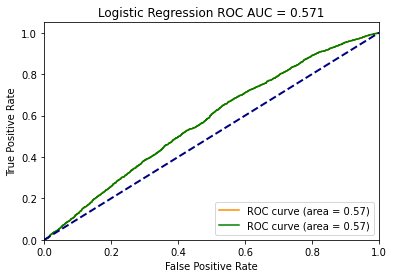

In [103]:
fpr_2, tpr_2, thresholds_2 = roc_curve(y_test, y_score_gr)

roc_auc_2 = auc(fpr_2, tpr_2)

plt.plot(fpr, tpr, color='darkorange', label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot(fpr_2, tpr_2, color='green', label='ROC curve (area = %0.2f)' % roc_auc_2)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

plt.title('Logistic Regression ROC AUC = %0.3f' % roc_auc)
plt.legend(loc="lower right")
plt.show()

### Анализ важных признаков при помощи shap

In [106]:
import shap

In [110]:
explainer = shap.LinearExplainer(lr_gr, X_train, feature_dependence='independent')
shap_values = explainer(X_test)

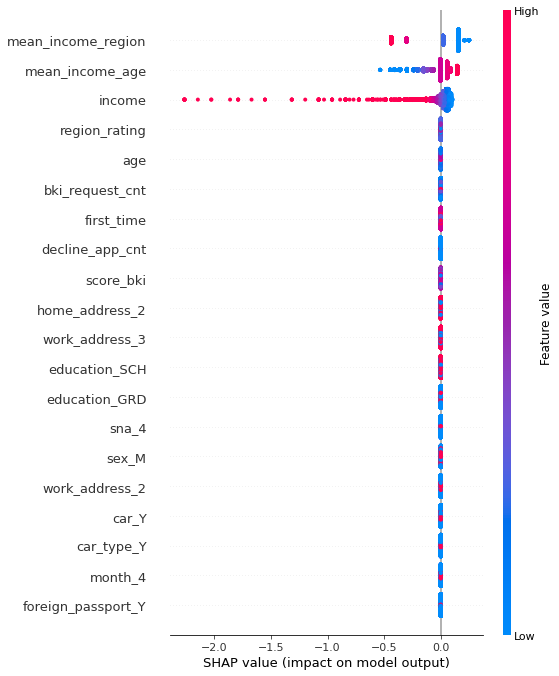

In [111]:
shap.summary_plot(shap_values, X_test)